In [21]:
import pandas as pd
import numpy as np
import os , shutil
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Input, Dropout,Flatten, Conv2D
from tensorflow.keras.layers import BatchNormalization, Activation, MaxPooling2D
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.utils import plot_model
from IPython.display import SVG, Image
from livelossplot import PlotLossesKeras

In [22]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("masoudnickparvar/brain-tumor-mri-dataset")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/brain-tumor-mri-dataset


In [23]:
train_path = path + '/Training'
test_path = path + '/Testing'
train = os.path.join(path , 'Training')
test = os.path.join(path , 'Testing')

In [25]:

for filename in os.listdir(train):
    print(filename)

pituitary
notumor
meningioma
glioma


In [46]:
# Data Augmentation

from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = ImageDataGenerator(rescale=1./255) # Only rescale test data

train_generator = train_datagen.flow_from_directory(train_path, target_size=(256, 256), batch_size=32, class_mode='categorical')


test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical'
)

Found 5712 images belonging to 4 classes.
Found 1311 images belonging to 4 classes.


In [48]:
train_batch = next(train_generator)
test_batch = next(test_generator)


In [49]:
print(test_batch[0].max())

1.0


In [28]:
len(train) #How many Batches (multiply by 32 if you working with the deafault parameters to get the number of Files)

179

In [50]:
#The train set will stay the same while deviding the test into val and test
#5712/(5712+1311) = 0.8 Which mean that the training data is 80%
val = test.take(int(len(test)*0.5))
test = test.skip(int(len(test)*0.5))
len(test)

21

In [51]:
model = Sequential([
    Conv2D(64, (3,3), 1, activation='relu', input_shape=(256,256,3)),
    MaxPooling2D(),
    Conv2D(64, (3,3), 1, activation='relu'),
    MaxPooling2D(),
    Conv2D(128, (3,3), 1, activation='relu'),
    MaxPooling2D(),
    Conv2D(128, (3,3), 1, activation='relu'),
    MaxPooling2D(),
    Conv2D(256, (3,3), 1, activation='relu'),
    MaxPooling2D(),
    Conv2D(256, (3,3), 1, activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(4, activation='softmax')
])
model.compile('adam', loss=tf.losses.SparseCategoricalCrossentropy(), metrics=['accuracy'])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [52]:
from tensorflow.keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=3)
hist = model.fit(train, epochs=10, validation_data=val, callbacks=[early_stopping])

Epoch 1/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - accuracy: 0.4001 - loss: 1.2109 - val_accuracy: 0.6875 - val_loss: 0.7741
Epoch 2/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - accuracy: 0.7540 - loss: 0.6010 - val_accuracy: 0.7797 - val_loss: 0.5428
Epoch 3/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - accuracy: 0.8417 - loss: 0.3953 - val_accuracy: 0.8672 - val_loss: 0.3341
Epoch 4/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - accuracy: 0.9014 - loss: 0.2637 - val_accuracy: 0.9141 - val_loss: 0.2283
Epoch 5/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - accuracy: 0.9431 - loss: 0.1730 - val_accuracy: 0.9469 - val_loss: 0.1530
Epoch 6/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - accuracy: 0.9581 - loss: 0.1198 - val_accuracy: 0.9266 - val_loss: 0.1742
Epoch 7/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - accuracy: 0.9740 - loss: 0.0727 - val_accuracy: 0.9516 - val_loss: 0.1470
Epoch 8/10
179/179 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - accuracy: 0.9684 - loss: 0.0918 -

In [59]:
from tensorflow.keras.metrics import Precision, Recall, BinaryAccuracy
for batch in test.as_numpy_iterator():
  pre = Precision()
  re = Recall()
  acc = BinaryAccuracy()
  X ,y = batch
  yhat = model.predict(X)
  y = tf.one_hot(y, depth=4)
  pre.update_state(y, yhat)
  re.update_state(y, yhat)
  acc.update_state(y, yhat)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


In [60]:
print(f'Precision {pre.result().numpy()} , Recall {re.result().numpy()} , Accuracy {acc.result().numpy()}')

Precision 0.8709677457809448 , Recall 0.8709677457809448 , Accuracy 0.9354838728904724


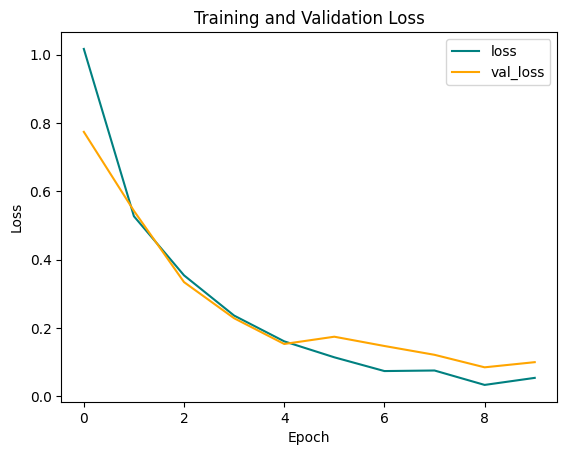

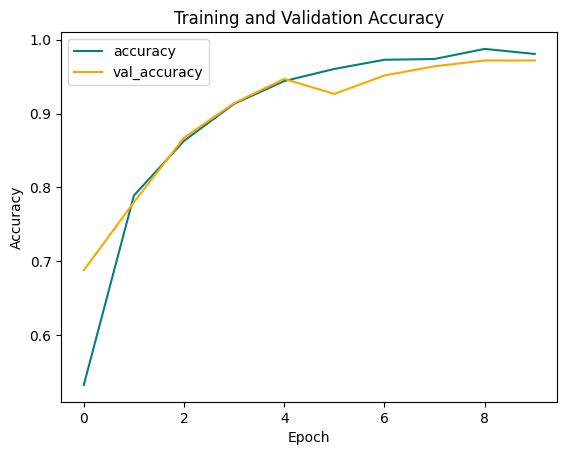

In [61]:
# Plot training and validation loss and accuracy
plt.plot(hist.history['loss'], color='teal', label='loss')
plt.plot(hist.history['val_loss'], color='orange', label='val_loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.plot(hist.history['accuracy'], color='teal', label='accuracy')
plt.plot(hist.history['val_accuracy'], color='orange', label='val_accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


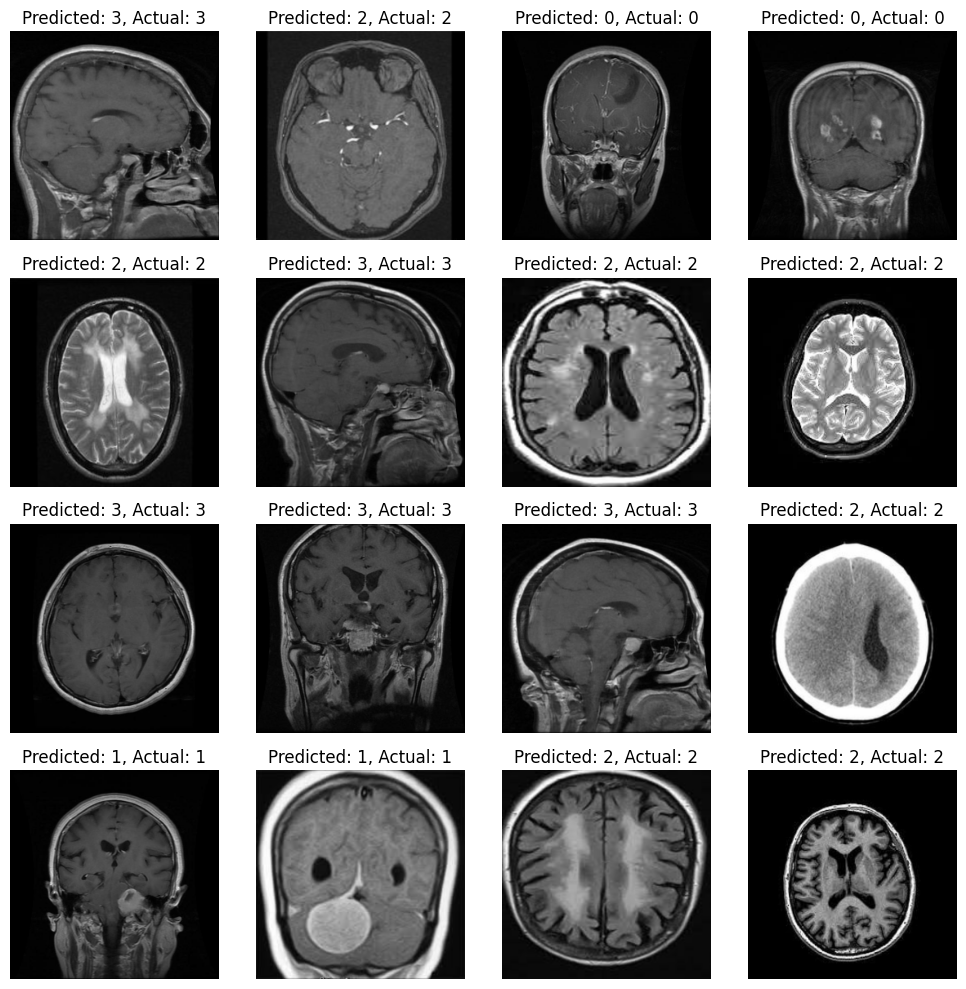

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


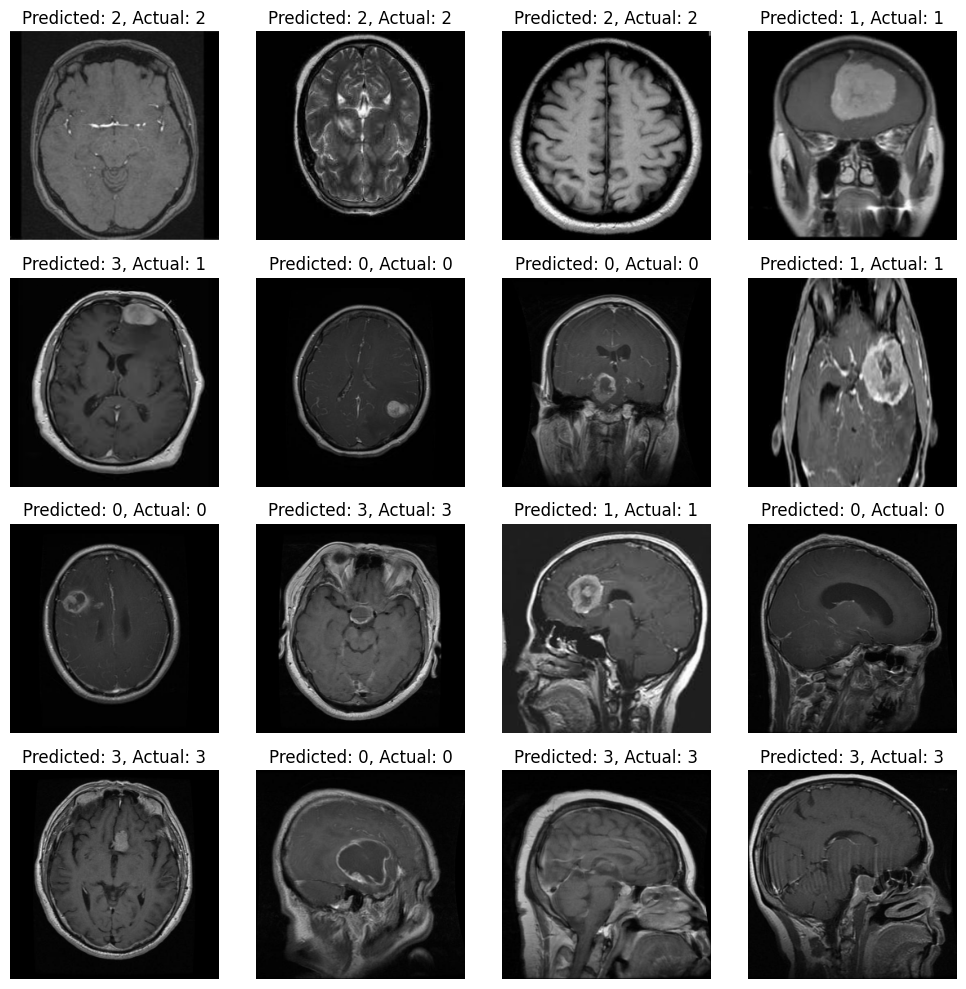

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


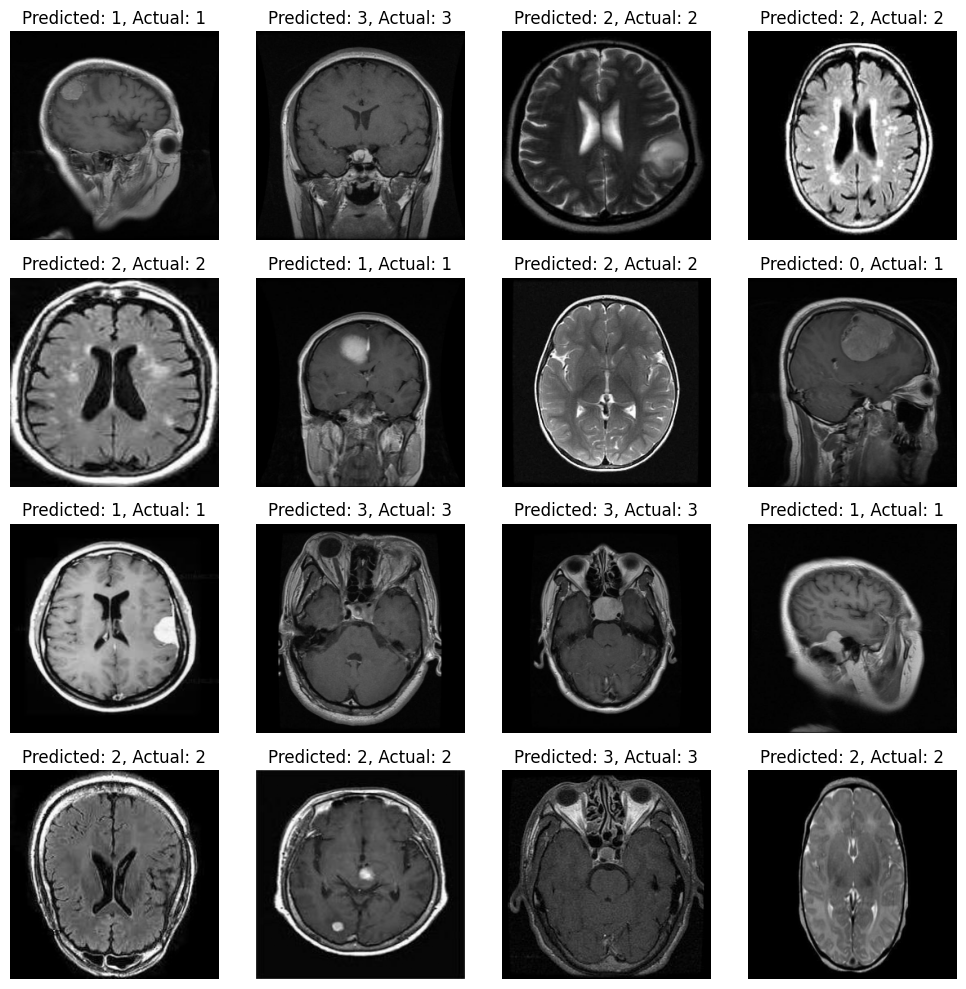

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


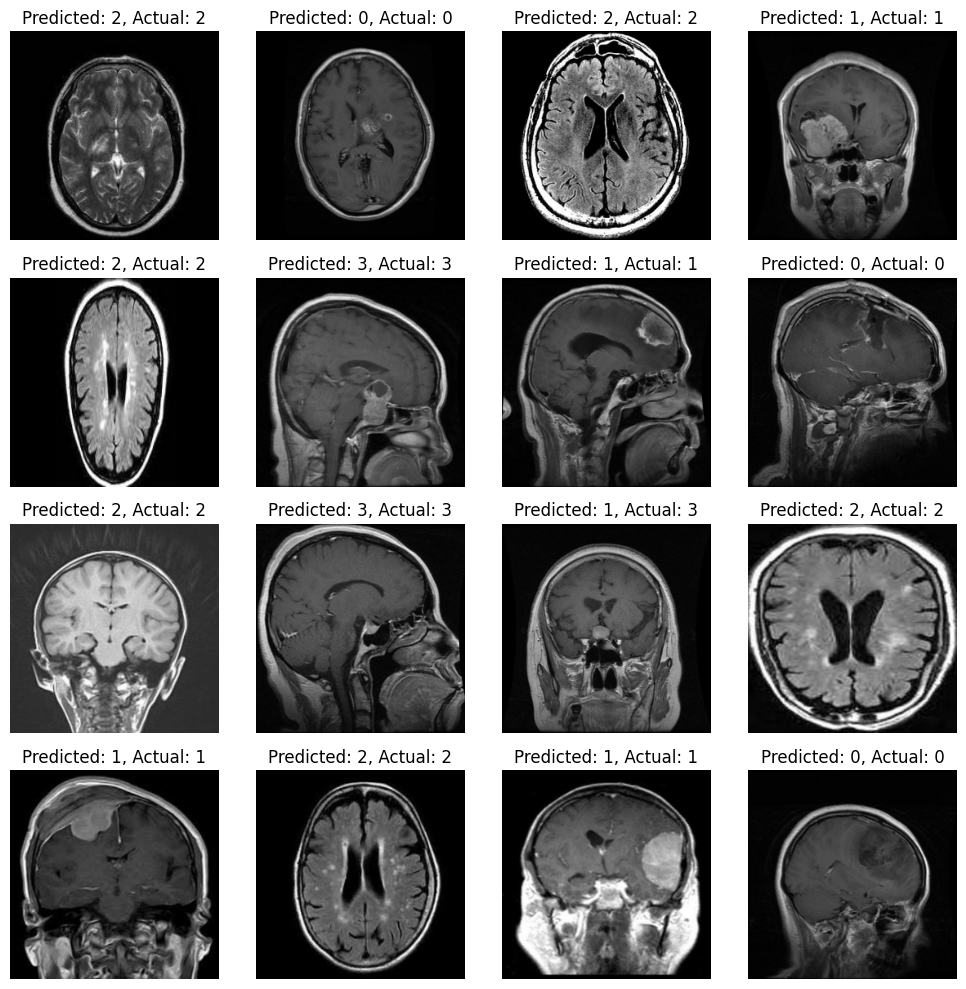

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


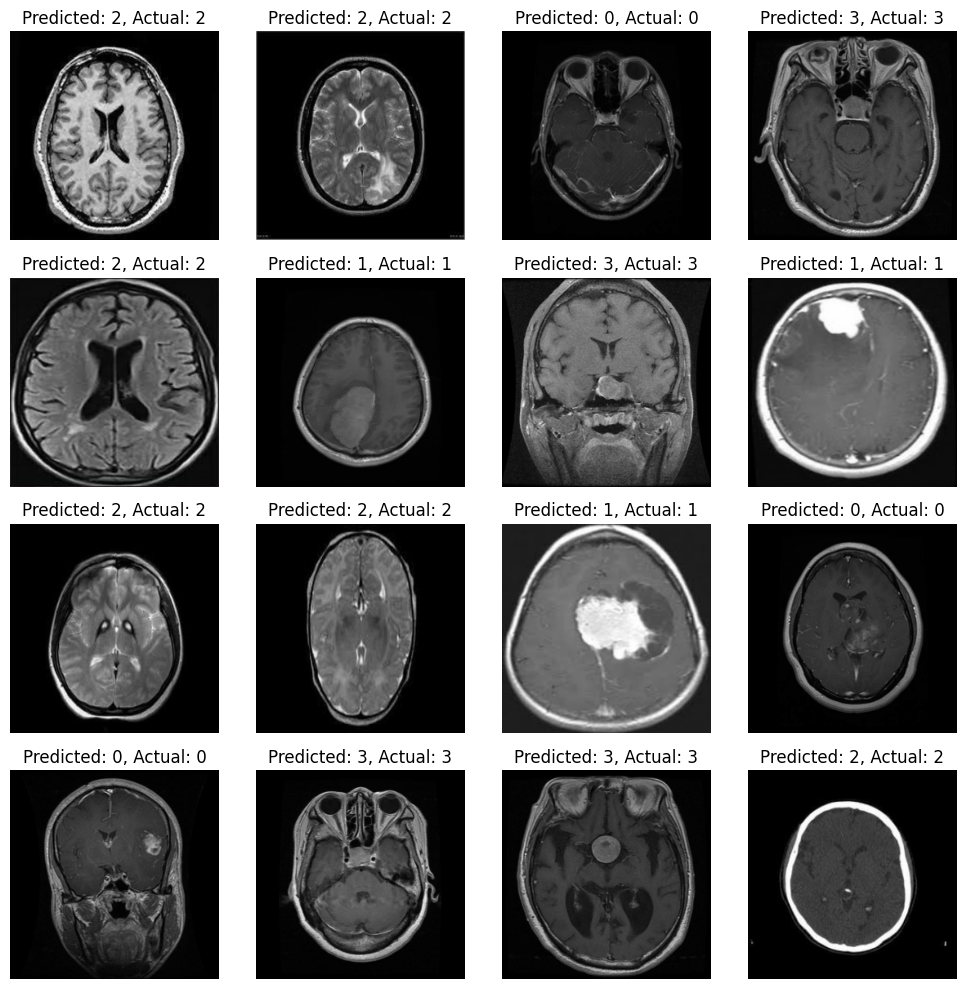

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


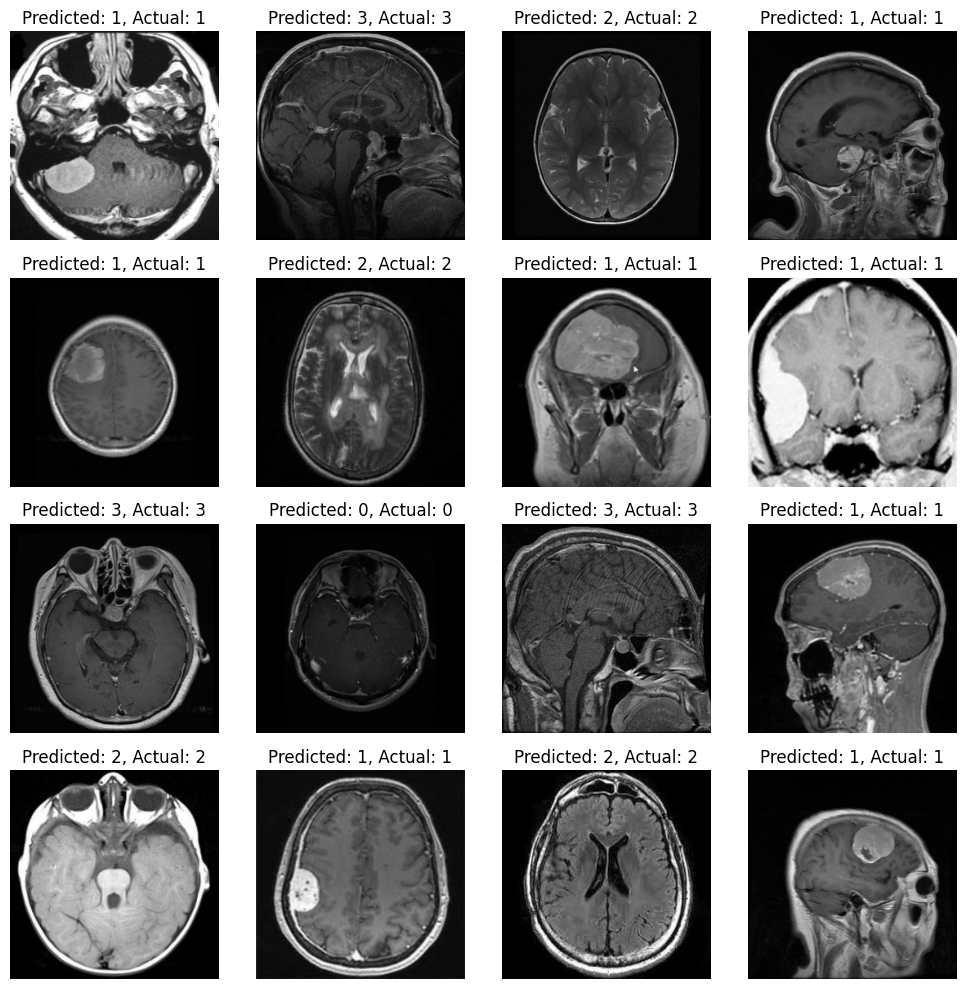

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


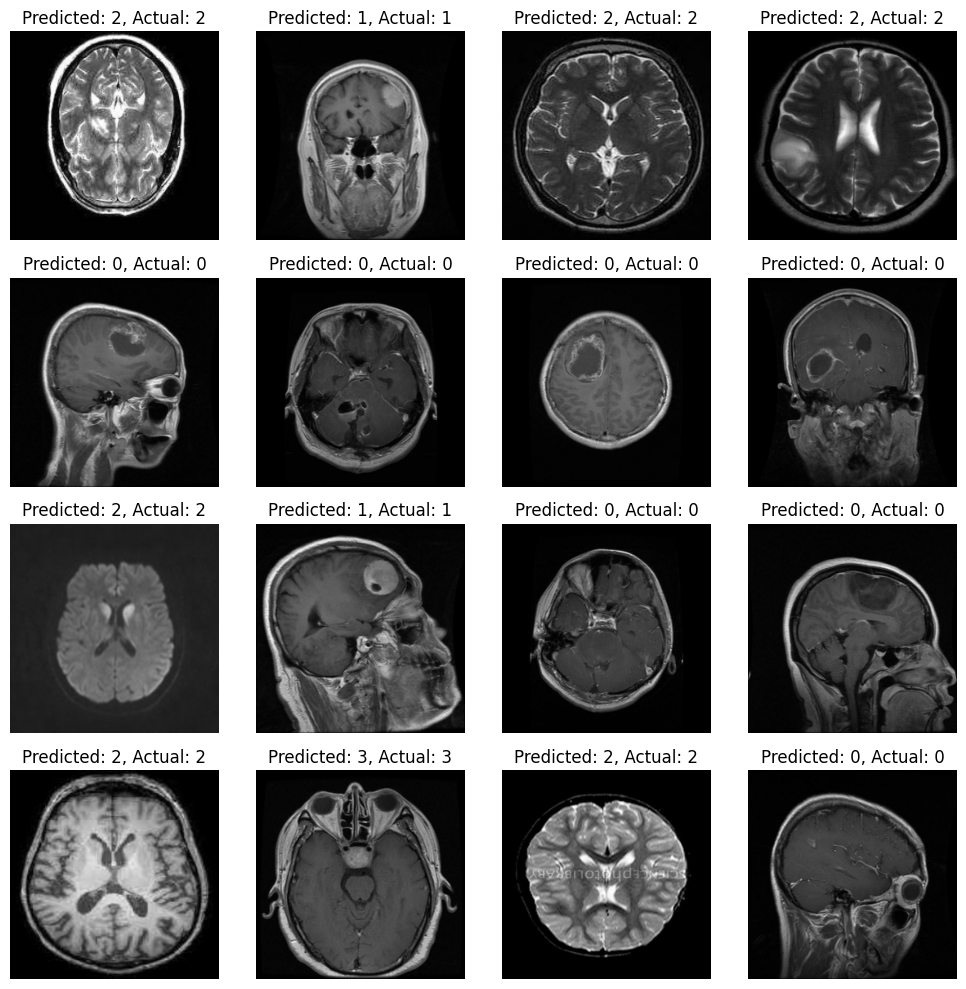

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


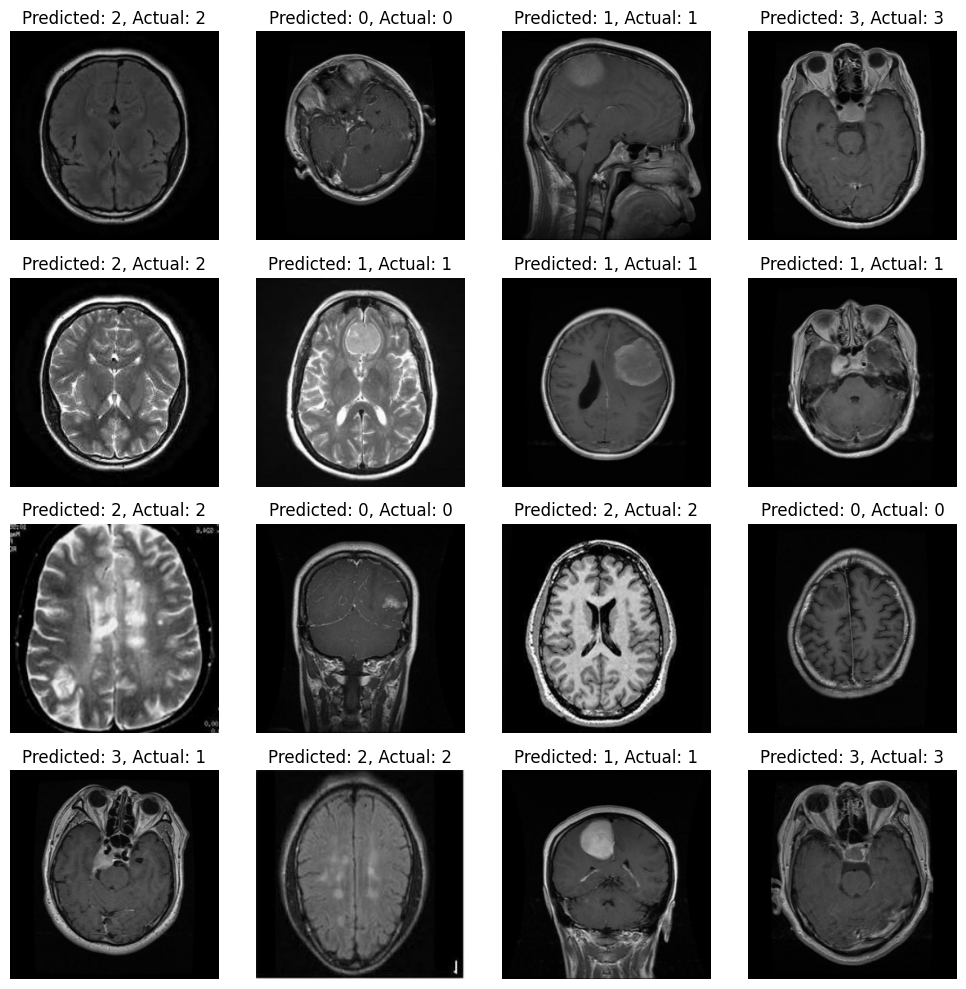

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


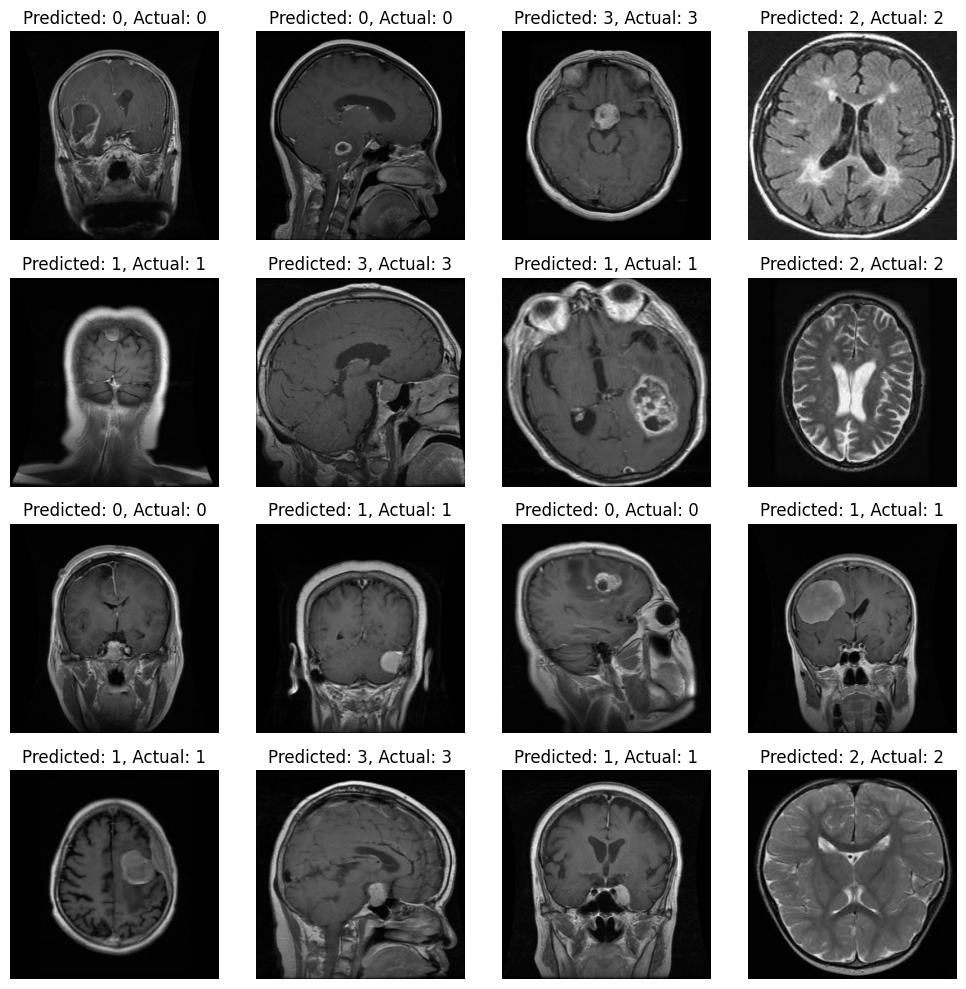

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


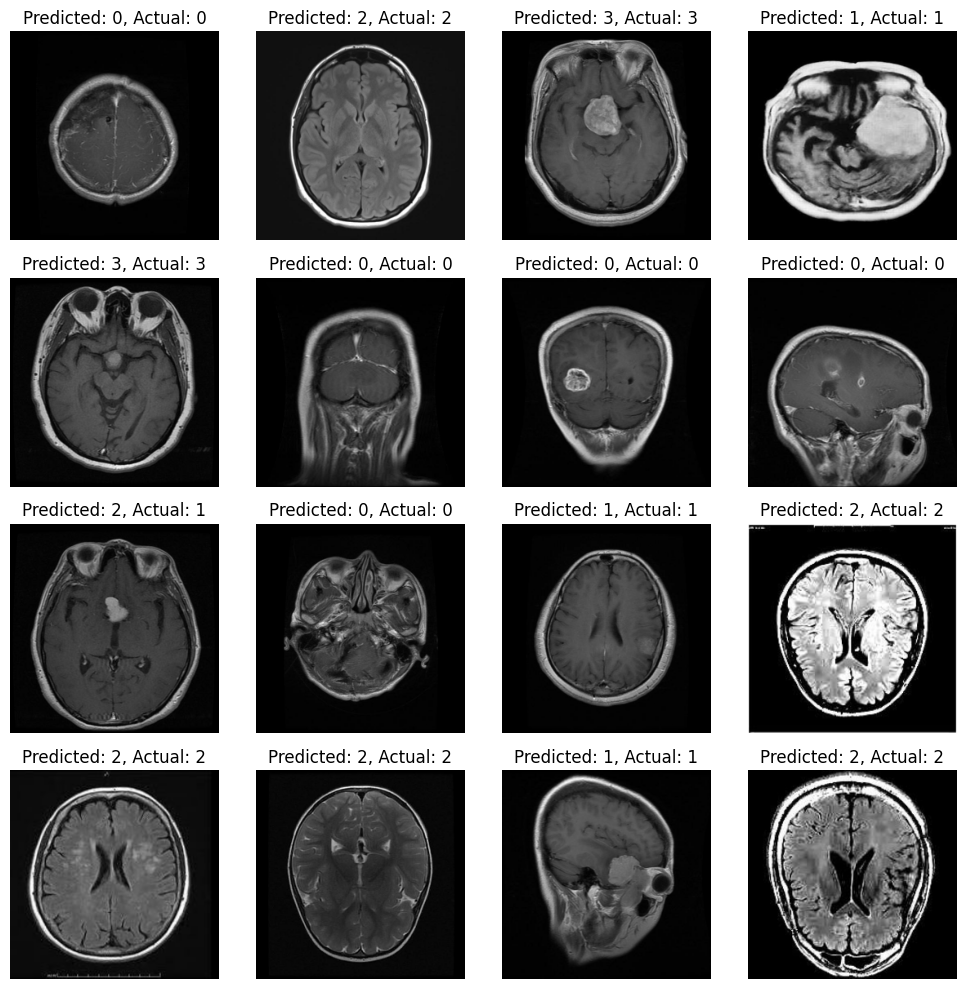

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


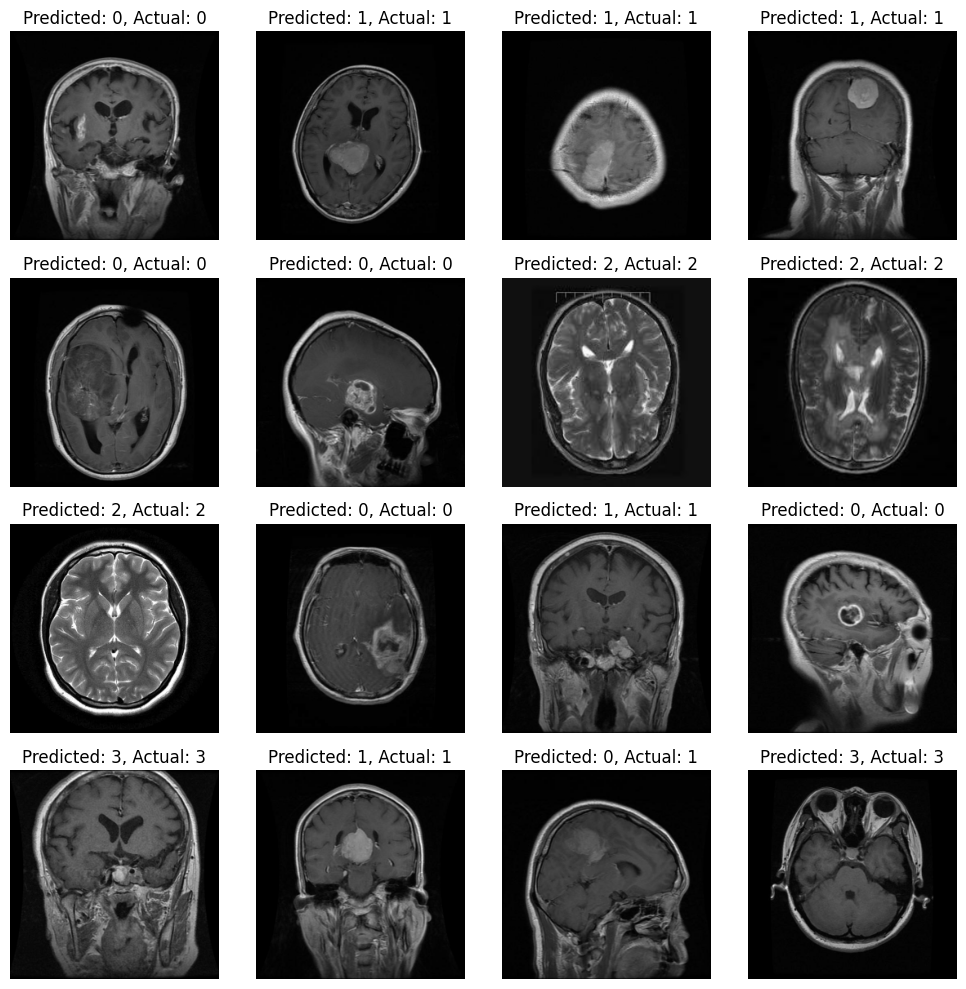

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


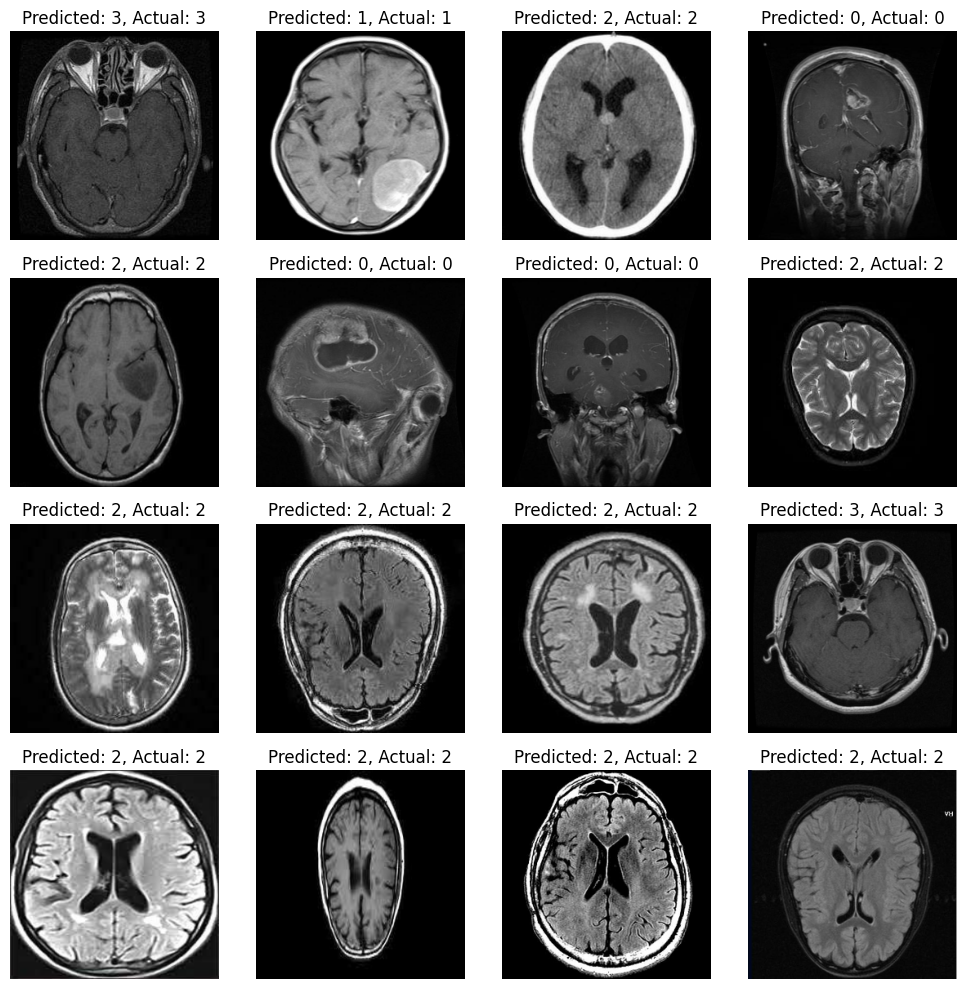

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


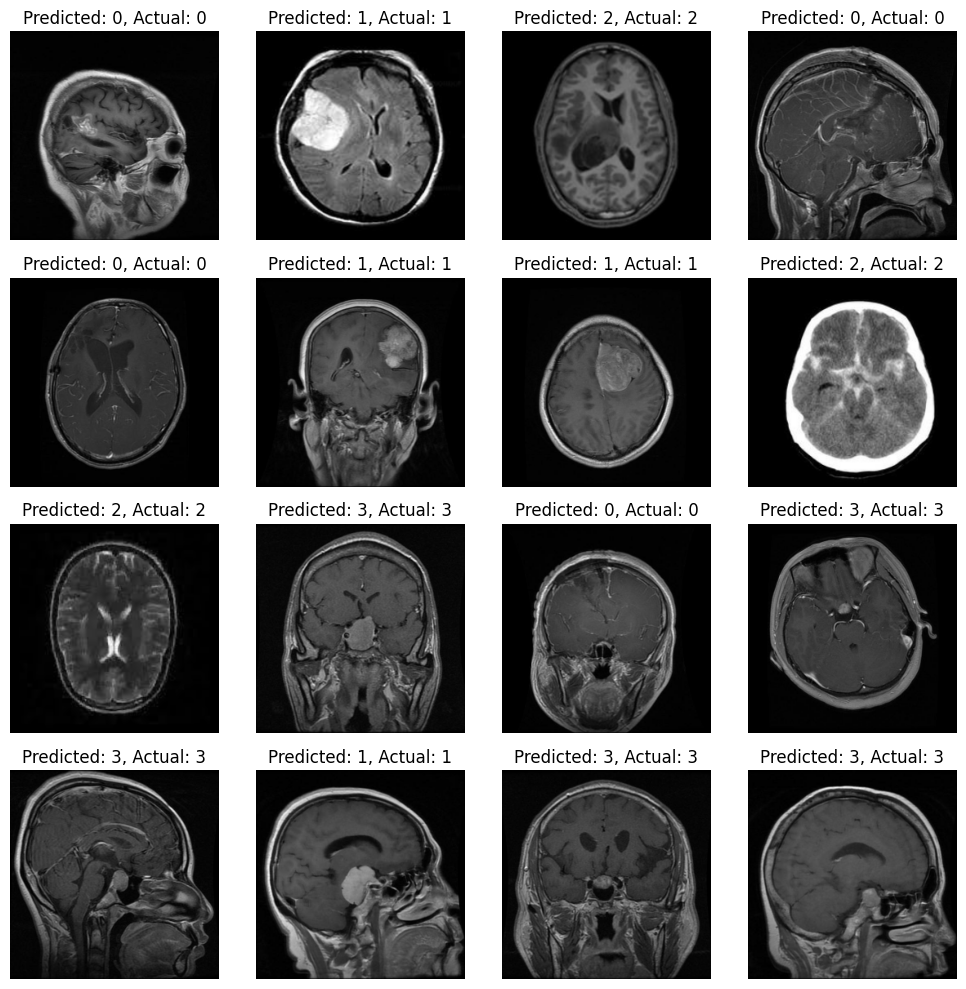

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


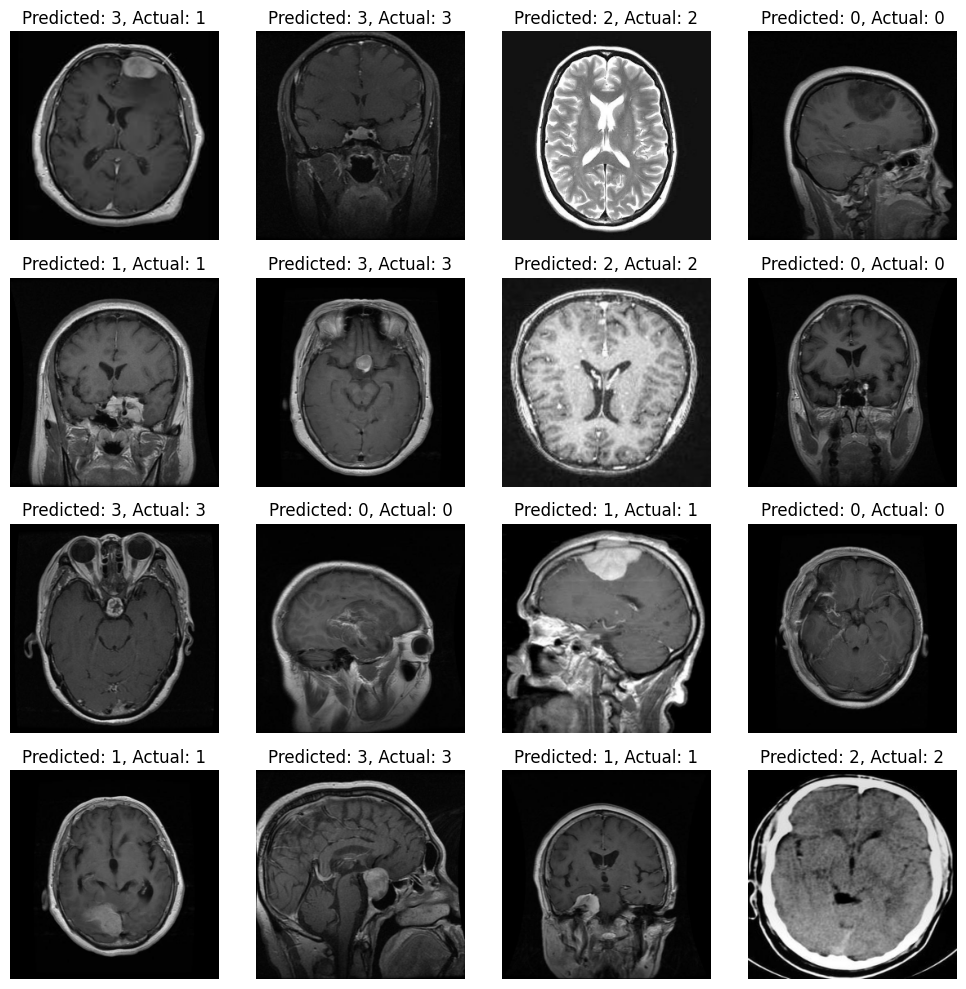

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


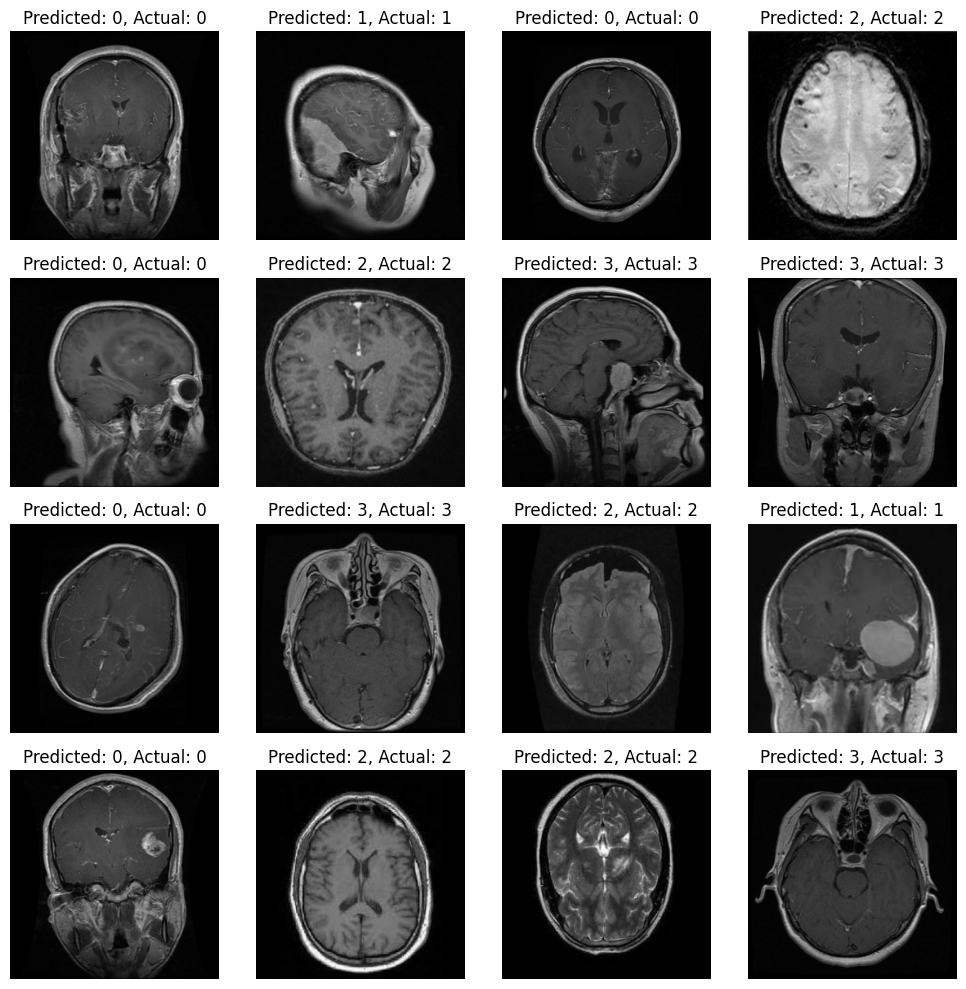

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


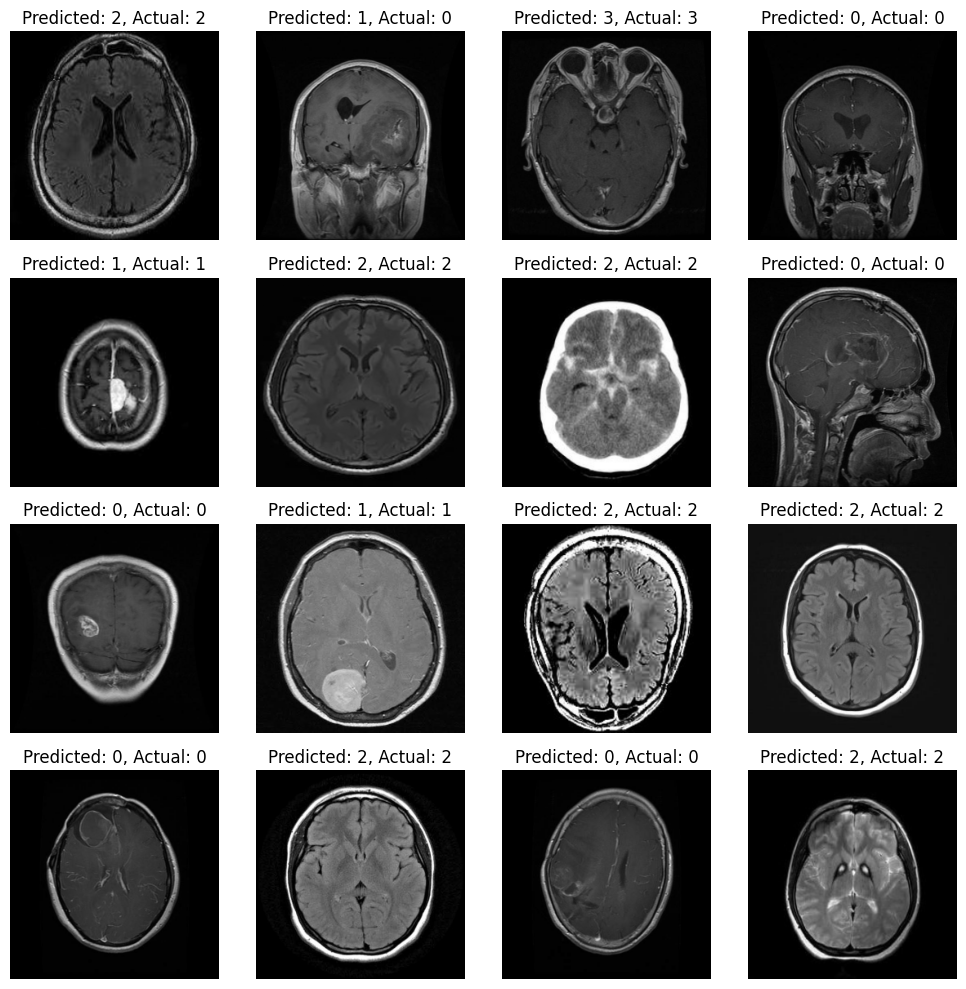

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


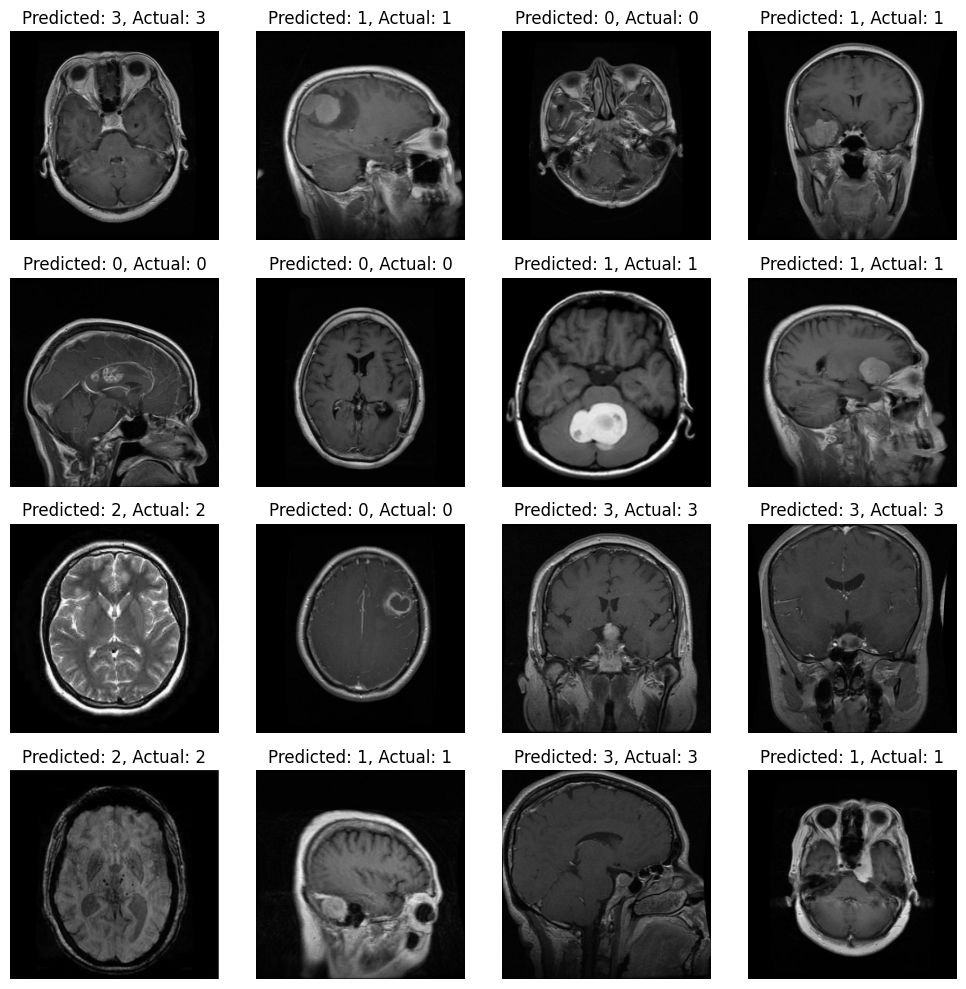

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


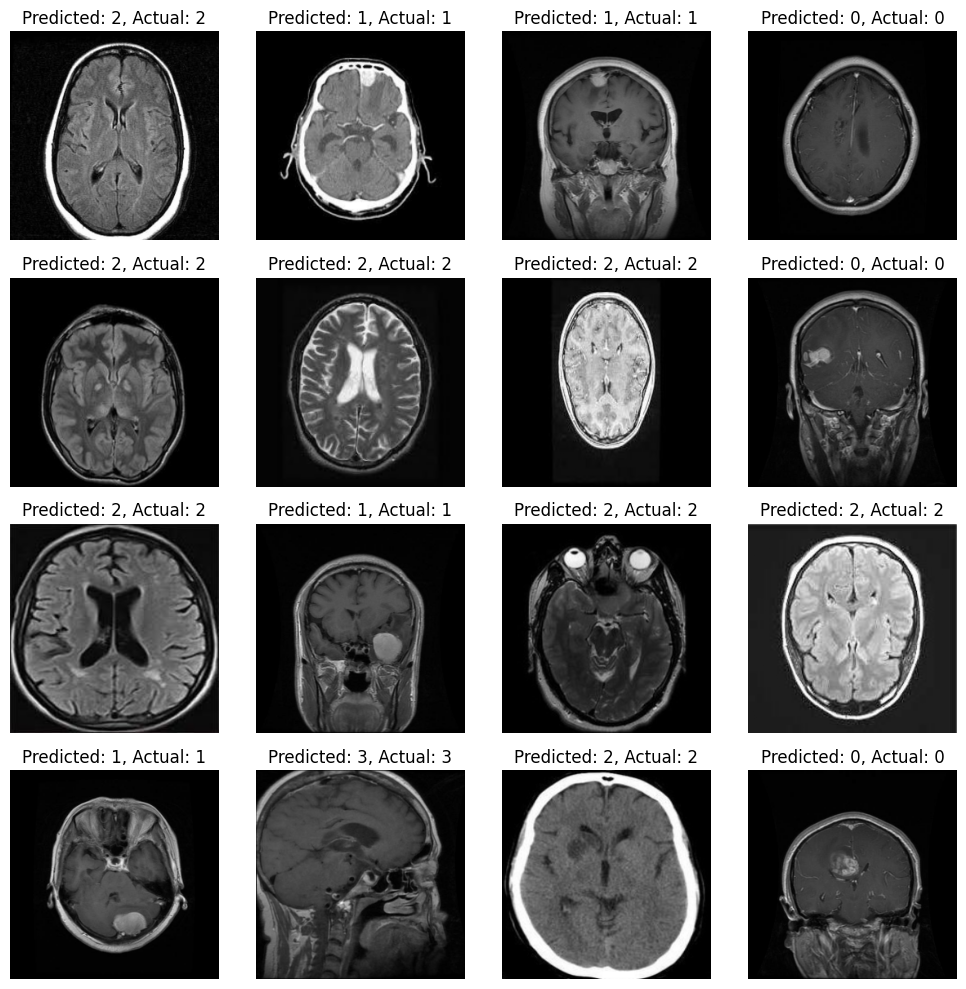

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


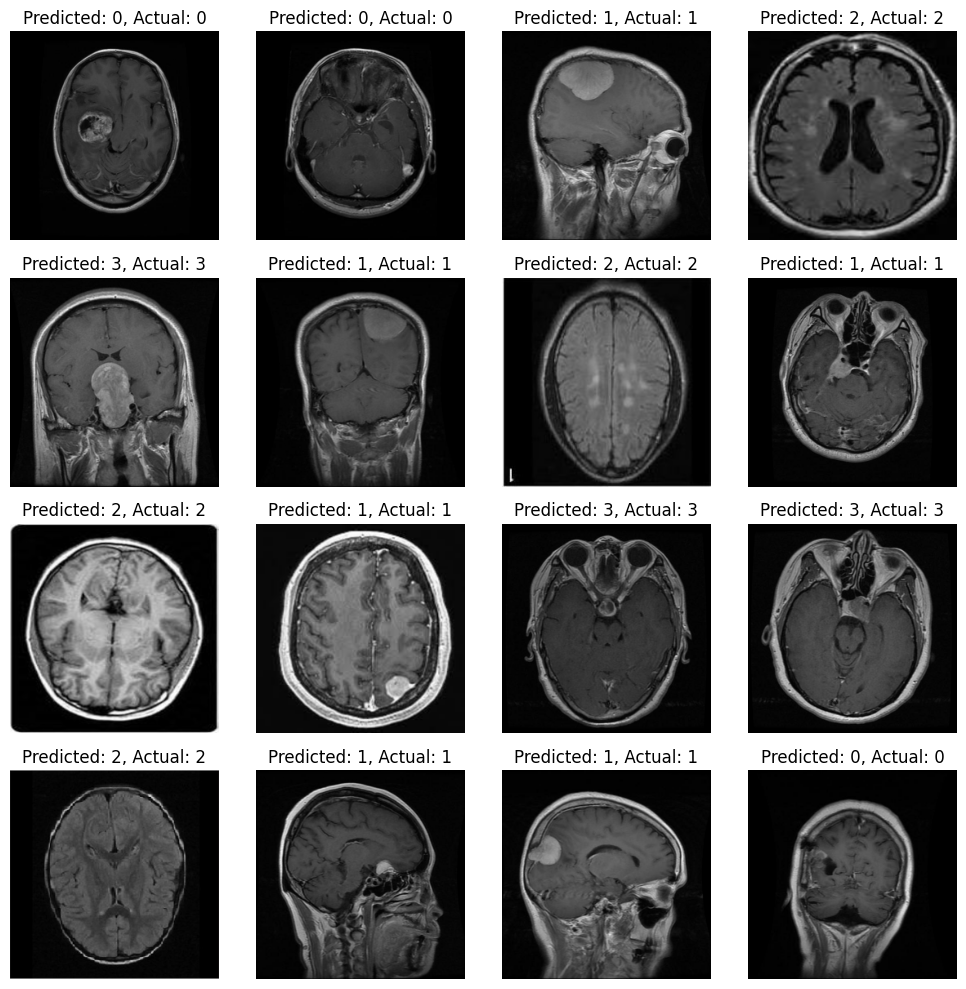

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


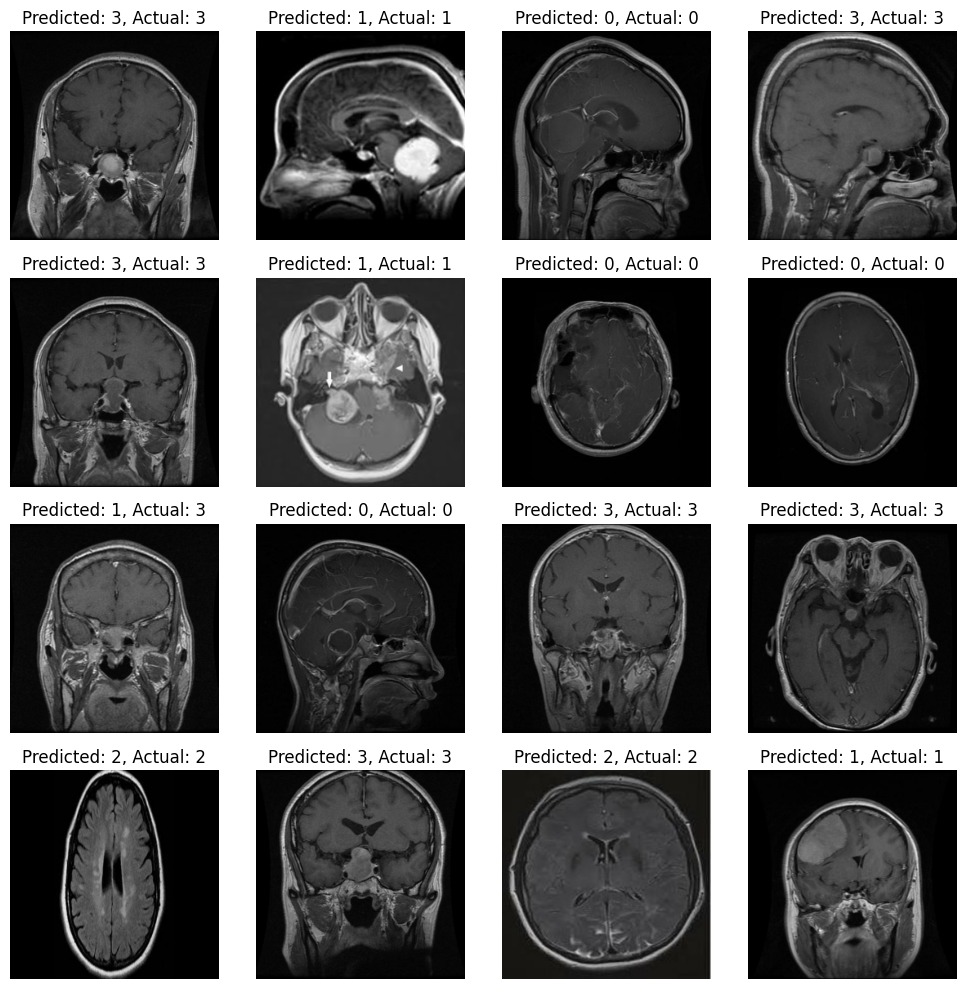

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


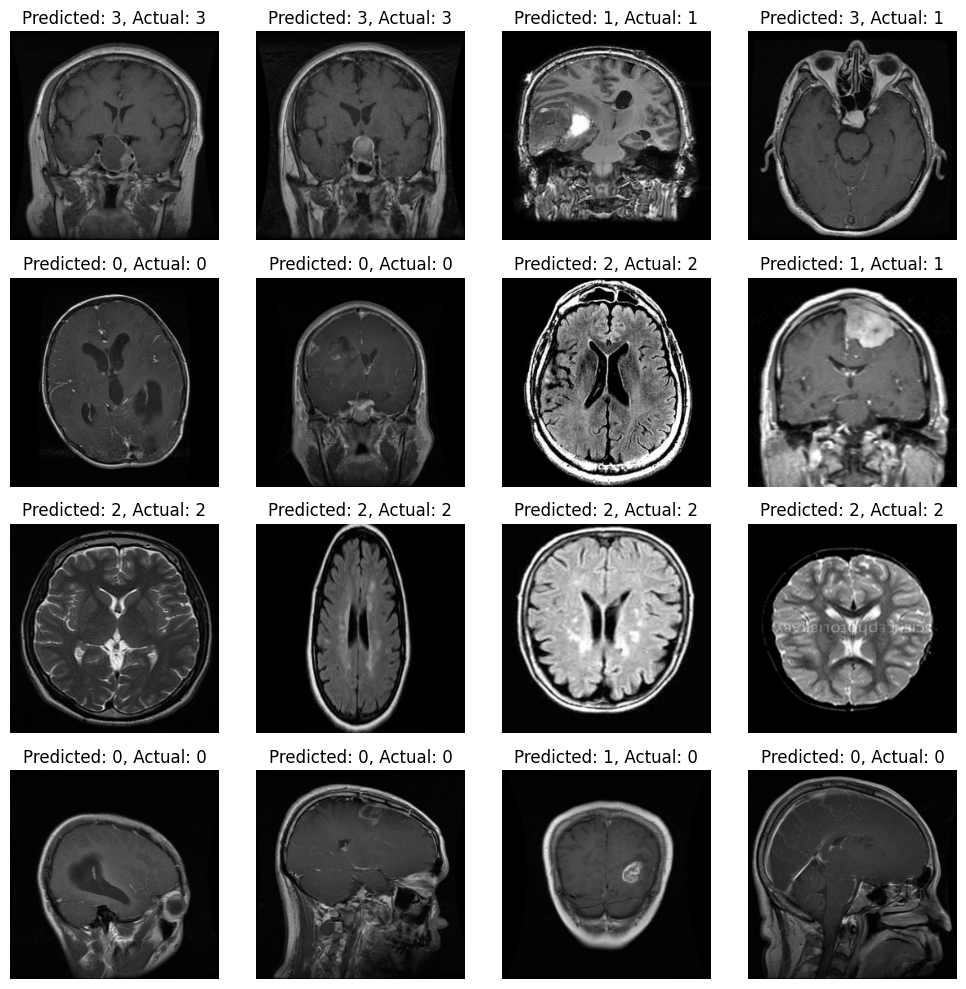

In [62]:
import matplotlib.pyplot as plt
import numpy as np


# Display images with predictions
for batch in test.as_numpy_iterator():
    X, y = batch
    yhat = model.predict(X)

    # Get predicted class labels
    predicted_labels = np.argmax(yhat, axis=1)

    # Display images with predictions
    fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10))  # Adjust nrows, ncols for desired grid
    for i in range(min(16, len(X))):  # Display up to 16 images per batch
        ax = axes[i // 4, i % 4]
        ax.imshow(X[i])
        ax.set_title(f"Predicted: {predicted_labels[i]}, Actual: {y[i]}")
        ax.axis('off')
    plt.tight_layout()
    plt.show()

In [63]:
from sklearn.metrics import confusion_matrix

# Initialize lists to store true and predicted labels
true_labels = []
predicted_labels = []

# Iterate over the test dataset and collect labels
for batch in test.as_numpy_iterator():
    X, y = batch
    yhat = model.predict(X)

    # Get predicted class labels
    predicted_batch_labels = np.argmax(yhat, axis=1)

    # Extend the lists with true and predicted labels
    true_labels.extend(y)
    predicted_labels.extend(predicted_batch_labels)

# Calculate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Calculate total number of predictions
total_predictions = len(true_labels)

# Calculate true predictions
true_predictions = np.trace(cm)  # Sum of diagonal elements of the confusion matrix

# Calculate false predictions
false_predictions = total_predictions - true_predictions

# Calculate percentage of true and false predictions
true_percentage = (true_predictions / total_predictions) * 100
false_percentage = (false_predictions / total_predictions) * 100

# Print the results
print(f"Percentage of True Predictions: {true_percentage:.2f}%")
print(f"Percentage of False Predictions: {false_percentage:.2f}%")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Percentage of True Predictions: 97.02%
Percentage of False Predictions: 2.98%


In [64]:
model.save('brain_tumor_model97acc.keras')

In [65]:
!nvidia-smi

Sun Jun  8 01:26:42 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   78C    P0             34W /   70W |    8488MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----